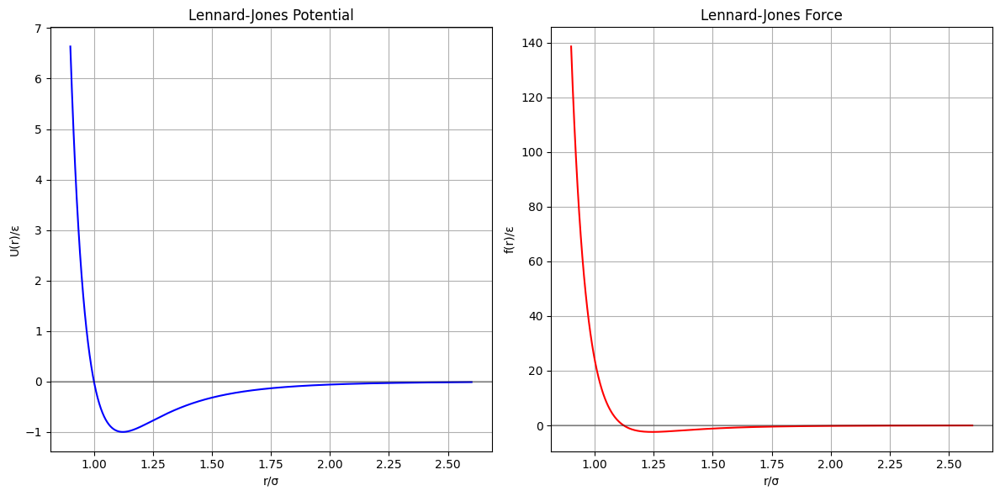

The force is zero at r = 1.122462σ
The force is repulsive for r < 1.122462σ
The force is attractive for r > 1.122462σ
The value of U(r) at r = 0.8σ is 42.948872ε
The value of U(r) at r = 0.72σ is 177.384120ε
The increase in U(r) when r decreases from 0.8σ to 0.72σ is 134.435248ε
The value of U(r) at r = 2.5σ is -0.016317ε


In [1]:
import numpy as np
import matplotlib.pyplot as plt

def lennard_jones_potential(r, epsilon=1.0, sigma=1.0):
    """Calculate the Lennard-Jones potential."""
    return 4 * epsilon * ((sigma/r)**12 - (sigma/r)**6)

def lennard_jones_force(r, epsilon=1.0, sigma=1.0):
    """Calculate the magnitude of the Lennard-Jones force."""
    return 24 * epsilon * (2 * (sigma/r)**12 - (sigma/r)**6) / r

# Create an array of r values
r_values = np.linspace(0.9, 2.6, 1000)

# Calculate potential and force for each r value
potential_values = [lennard_jones_potential(r) for r in r_values]
force_values = [lennard_jones_force(r) for r in r_values]

# Create a figure with two subplots
plt.figure(figsize=(12, 6))

# Plot the potential
plt.subplot(1, 2, 1)
plt.plot(r_values, potential_values, 'b-')
plt.grid(True)
plt.xlabel('r/σ')
plt.ylabel('U(r)/ε')
plt.title('Lennard-Jones Potential')

# Add a horizontal line at U=0
plt.axhline(y=0, color='k', linestyle='-', alpha=0.3)

# Plot the force
plt.subplot(1, 2, 2)
plt.plot(r_values, force_values, 'r-')
plt.grid(True)
plt.xlabel('r/σ')
plt.ylabel('f(r)/ε')
plt.title('Lennard-Jones Force')

# Add a horizontal line at f=0
plt.axhline(y=0, color='k', linestyle='-', alpha=0.3)

plt.tight_layout()
plt.show()

# Find where force is zero (the minimum of potential)
r_min = 2**(1/6)
print(f"The force is zero at r = {r_min:.6f}σ")

# For what values is the force repulsive?
print(f"The force is repulsive for r < {r_min:.6f}σ")
print(f"The force is attractive for r > {r_min:.6f}σ")

# Calculate U(r) for r = 0.8σ
r_08 = 0.8
u_08 = lennard_jones_potential(r_08)
print(f"The value of U(r) at r = 0.8σ is {u_08:.6f}ε")

# Calculate U(r) for r = 0.72σ (10% decrease from 0.8σ)
r_072 = 0.72
u_072 = lennard_jones_potential(r_072)
print(f"The value of U(r) at r = 0.72σ is {u_072:.6f}ε")
print(f"The increase in U(r) when r decreases from 0.8σ to 0.72σ is {u_072 - u_08:.6f}ε")

# Calculate U(r) for r = 2.5σ
r_25 = 2.5
u_25 = lennard_jones_potential(r_25)
print(f"The value of U(r) at r = 2.5σ is {u_25:.6f}ε")

In [2]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib import animation
from IPython.display import HTML

# Setup with fewer frames but more visible movement
steps = 100
x = np.linspace(-1, 1, steps)  # Move across the x-axis
y = np.linspace(-1, 1, steps)  # Move across the y-axis

# Create animation
fig, ax = plt.subplots(figsize=(5, 5))
ax.set_xlim([-1, 1])
ax.set_ylim([-1, 1])
point, = ax.plot([], [], 'o', markersize=10)

def init():
    point.set_data([], [])
    return (point,)

def animate(i):
    point.set_data([x[i]], [y[i]])
    return (point,)

ani = animation.FuncAnimation(
    fig, animate, init_func=init,
    frames=steps, interval=50, blit=True)

# Display with controls
plt.close()
HTML(ani.to_jshtml())

In [3]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib import animation
from IPython.display import HTML

# Setup
steps = 300
x, y = np.zeros(steps), np.zeros(steps)
vx, vy = 0.02, 0.03  # Different velocities for x and y for more interesting motion
dt = 0.5

# Calculate trajectory with periodic boundaries
x[0], y[0] = 0, 0  # Starting position
for i in range(1, steps):
    # Update position with velocity and apply periodic boundary
    x[i] = (x[i-1] + vx*dt) % 2 - 1
    y[i] = (y[i-1] + vy*dt) % 2 - 1

# Create animation
fig, ax = plt.subplots(figsize=(5, 5))
ax.set_xlim([-1, 1])
ax.set_ylim([-1, 1])
ax.set_xlabel('X Position')
ax.set_ylabel('Y Position')
ax.set_title('Particle with Periodic Boundary Conditions')
ax.grid(True)
point, = ax.plot([], [], 'o', markersize=10, color='blue')

def init():
    point.set_data([], [])
    return (point,)

def animate(i):
    point.set_data([x[i]], [y[i]])
    return (point,)

ani = animation.FuncAnimation(
    fig, animate, init_func=init,
    frames=steps, interval=1, blit=True)

# Display with controls
plt.close()
HTML(ani.to_jshtml())

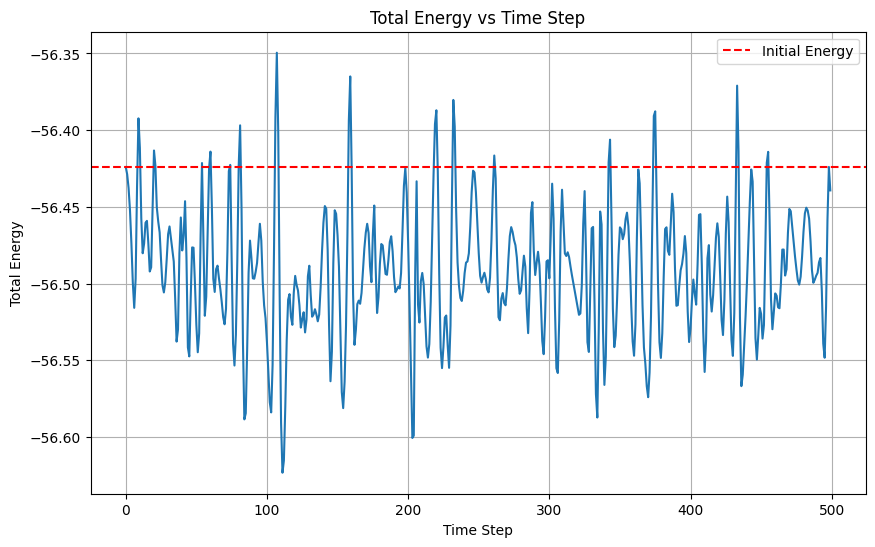

Initial energy: -56.4240
Final energy: -56.4393
Energy drift: 0.027063%
Average temperature: 0.8888


In [4]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
from IPython.display import HTML

class LJParticles:
    def __init__(self, N=64, L=10.0, temperature=1.0, dt=0.01):
        # Initialize system parameters
        self.N = N
        self.L = L  # Square box (L×L)
        self.dt = dt
        self.initial_temperature = temperature

        # Arrays for positions, velocities, and accelerations
        self.x = np.zeros(N)
        self.y = np.zeros(N)
        self.vx = np.zeros(N)
        self.vy = np.zeros(N)
        self.ax = np.zeros(N)
        self.ay = np.zeros(N)

        # Tracking
        self.time = 0.0
        self.potential_energy = 0.0
        self.kinetic_energy = 0.0
        self.total_energy = 0.0

        # Initialize particles on a square lattice with 8×8 grid
        self.set_square_lattice()

        # Initialize velocities to get the desired temperature
        self.set_velocities()

        # Calculate initial accelerations and energy
        self.compute_acceleration()
        self.compute_energy()

    def set_square_lattice(self):
        """Place particles on a square lattice"""
        nx = int(np.sqrt(self.N))  # 8 particles per row
        ny = nx  # 8 particles per column

        # Calculate spacing between particles
        dx = self.L / nx
        dy = self.L / ny

        # Place particles
        count = 0
        for ix in range(nx):
            for iy in range(ny):
                if count < self.N:
                    self.x[count] = dx * (ix + 0.5)  # Center in the cell
                    self.y[count] = dy * (iy + 0.5)
                    count += 1

    def set_velocities(self):
        """Set random velocities with zero center-of-mass momentum"""
        # Generate random velocities
        self.vx = np.random.randn(self.N) - 0.5
        self.vy = np.random.randn(self.N) - 0.5

        # Set center-of-mass momentum to zero
        self.vx -= np.mean(self.vx)
        self.vy -= np.mean(self.vy)

        # Calculate current kinetic energy
        current_ke = 0.5 * np.sum(self.vx**2 + self.vy**2) / self.N

        # Scale velocities to match desired temperature
        scale_factor = np.sqrt(self.initial_temperature / current_ke)
        self.vx *= scale_factor
        self.vy *= scale_factor

    def pbc_separation(self, dr, L):
        """Apply minimum image convention for distance"""
        if dr > 0.5 * L:
            return dr - L
        elif dr < -0.5 * L:
            return dr + L
        return dr

    def pbc_position(self, r, L):
        """Apply periodic boundary conditions to position"""
        return r % L

    def compute_acceleration(self):
        """Calculate forces and accelerations using Lennard-Jones potential"""
        # Reset accelerations and potential energy
        self.ax = np.zeros(self.N)
        self.ay = np.zeros(self.N)
        self.potential_energy = 0.0

        # Loop over all pairs of particles
        for i in range(self.N - 1):
            for j in range(i + 1, self.N):
                # Calculate separation with periodic boundary conditions
                dx = self.pbc_separation(self.x[i] - self.x[j], self.L)
                dy = self.pbc_separation(self.y[i] - self.y[j], self.L)

                # Square distance
                r2 = dx**2 + dy**2

                # Compute Lennard-Jones force and potential
                if r2 > 0:  # Avoid division by zero
                    r2i = 1.0 / r2
                    r6i = r2i**3
                    f_mag= 48.0 * r2i * r6i * (r6i - 0.5)

                    # Update accelerations
                    self.ax[i] += f_mag* dx
                    self.ay[i] += f_mag* dy
                    self.ax[j] -= f_mag* dx
                    self.ay[j] -= f_mag* dy

                    # Update potential energy
                    self.potential_energy += 4.0 * r6i * (r6i - 1.0)

    def compute_energy(self):
        """Calculate the kinetic energy and total energy"""
        self.kinetic_energy = 0.5 * np.sum(self.vx**2 + self.vy**2)
        self.total_energy = self.kinetic_energy + self.potential_energy

    def get_temperature(self):
        """Calculate the current temperature based on equation (8.5)"""
        # For 2D system with N particles
        return np.sum(self.vx**2 + self.vy**2) / (2 * self.N)

    def step(self):
        """Perform one time step using the Velocity Verlet algorithm"""
        # First half of velocity update
        self.vx += 0.5 * self.dt * self.ax
        self.vy += 0.5 * self.dt * self.ay

        # Update positions
        self.x += self.dt * self.vx
        self.y += self.dt * self.vy

        # Apply periodic boundary conditions
        for i in range(self.N):
            self.x[i] = self.pbc_position(self.x[i], self.L)
            self.y[i] = self.pbc_position(self.y[i], self.L)

        # Calculate new accelerations
        self.compute_acceleration()

        # Second half of velocity update
        self.vx += 0.5 * self.dt * self.ax
        self.vy += 0.5 * self.dt * self.ay

        # Update energy and time
        self.compute_energy()
        self.time += self.dt

# Create the simulation
sim = LJParticles(N=64, L=10.0, temperature=1.0, dt=0.01)

# Run simulation and record positions
num_steps = 500
positions_history = []
energy_values = []
temp_values = []

# Save initial positions
positions_history.append((sim.x.copy(), sim.y.copy()))

# Run the simulation
for i in range(num_steps):
    sim.step()
    energy_values.append(sim.total_energy)
    temp_values.append(sim.get_temperature())

    # Save positions every few steps to make the animation smoother
    if i % 5 == 0:
        positions_history.append((sim.x.copy(), sim.y.copy()))

# Plot energy conservation
plt.figure(figsize=(10, 6))
plt.plot(range(len(energy_values)), energy_values)
plt.axhline(y=energy_values[0], color='r', linestyle='--', label='Initial Energy')
plt.title('Total Energy vs Time Step')
plt.xlabel('Time Step')
plt.ylabel('Total Energy')
plt.legend()
plt.grid(True)
plt.show()

# Print final values
print(f"Initial energy: {energy_values[0]:.4f}")
print(f"Final energy: {energy_values[-1]:.4f}")
print(f"Energy drift: {(energy_values[-1] - energy_values[0])/energy_values[0]*100:.6f}%")
print(f"Average temperature: {np.mean(temp_values):.4f}")

# Create animation
fig, ax = plt.subplots(figsize=(8, 8))
ax.set_xlim(0, sim.L)
ax.set_ylim(0, sim.L)
ax.set_xlabel('x')
ax.set_ylabel('y')
ax.set_title('Lennard-Jones Particles Simulation (N=64, L=10)')
ax.grid(True)

# Draw boundary box
ax.plot([0, sim.L, sim.L, 0, 0], [0, 0, sim.L, sim.L, 0], 'k-')
plt.close()

# Create scatter plot for particles
particles = ax.scatter([], [], s=30)

# Animation function
def init():
    particles.set_offsets(np.c_[[], []])
    return [particles]

def animate(i):
    x, y = positions_history[i]
    particles.set_offsets(np.c_[x, y])
    return [particles]

# Create animation
anim = FuncAnimation(
    fig, animate, init_func=init,
    frames=len(positions_history), interval=50, blit=True
)

# Display animation (for Jupyter notebook)
HTML(anim.to_jshtml())

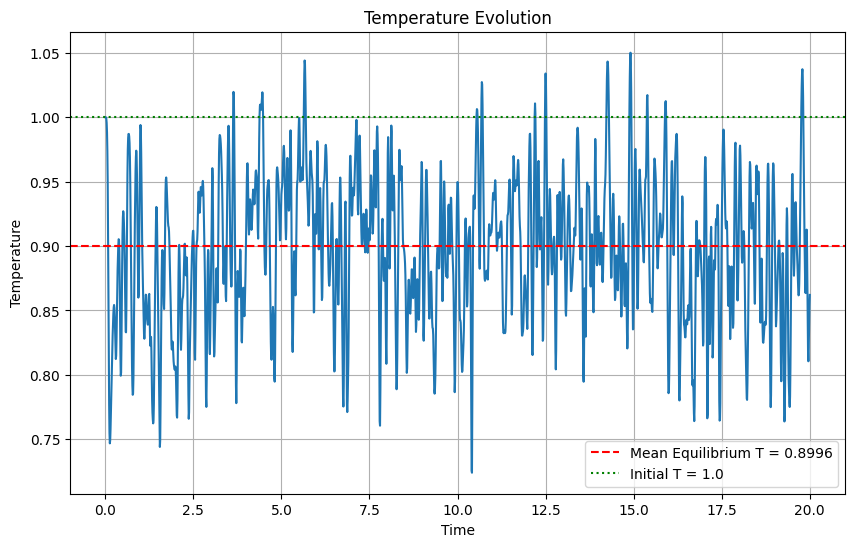

Initial temperature: 1.0000
Mean equilibrium temperature: 0.8996
Temperature fluctuations (std): 0.0550
Temperature range: [0.7240, 1.0500]
Total energy: -56.4908


In [5]:
# Create the simulation
sim = LJParticles(N=64, L=10.0, temperature=1.0, dt=0.01)

# Run simulation and track temperature
num_steps = 2000  # Run longer to observe equilibration
time_points = np.zeros(num_steps + 1)
temp_values = np.zeros(num_steps + 1)
energy_values = np.zeros(num_steps + 1)

# Record initial values
temp_values[0] = sim.get_temperature()
energy_values[0] = sim.potential_energy + sim.kinetic_energy

# Run the simulation
for i in range(num_steps):
    sim.step()
    time_points[i+1] = sim.time
    temp_values[i+1] = sim.get_temperature()
    energy_values[i+1] = sim.potential_energy + sim.kinetic_energy

# Plot temperature evolution
plt.figure(figsize=(10, 6))
plt.plot(time_points, temp_values)
plt.axhline(y=np.mean(temp_values[1000:]), color='r', linestyle='--',
           label=f'Mean Equilibrium T = {np.mean(temp_values[1000:]):.4f}')
plt.axhline(y=1.0, color='g', linestyle=':', label='Initial T = 1.0')
plt.title('Temperature Evolution')
plt.xlabel('Time')
plt.ylabel('Temperature')
plt.grid(True)
plt.legend()
plt.show()

# Calculate statistics about equilibrium temperature
equilibrium_temp = np.mean(temp_values[1000:])
temp_std = np.std(temp_values[1000:])
temp_min = np.min(temp_values[1000:])
temp_max = np.max(temp_values[1000:])

print(f"Initial temperature: {temp_values[0]:.4f}")
print(f"Mean equilibrium temperature: {equilibrium_temp:.4f}")
print(f"Temperature fluctuations (std): {temp_std:.4f}")
print(f"Temperature range: [{temp_min:.4f}, {temp_max:.4f}]")
print(f"Total energy: {np.mean(energy_values[1000:]):.4f}")

In [6]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
from IPython.display import HTML

class LJParticles:
    def __init__(self, N=64, Lx=20.0, Ly=10.0, temperature=1.0, dt=0.01):
        # Initialize system parameters
        self.N = N
        self.Lx = Lx
        self.Ly = Ly
        self.dt = dt
        self.initial_temperature = temperature

        # Arrays for positions, velocities, and accelerations
        self.x = np.zeros(N)
        self.y = np.zeros(N)
        self.vx = np.zeros(N)
        self.vy = np.zeros(N)
        self.ax = np.zeros(N)
        self.ay = np.zeros(N)

        # Tracking
        self.time = 0.0
        self.potential_energy = 0.0
        self.kinetic_energy = 0.0
        self.total_energy = 0.0

        # For part (c): Place all particles on the left side
        self.set_left_side_rectangular_lattice()

        # Initialize velocities to get the desired temperature
        self.set_velocities()

        # Calculate initial accelerations and energy
        self.compute_acceleration()
        self.compute_energy()

    def set_left_side_rectangular_lattice(self):
        """Place all particles on the left half of the box (0 to Lx/2)"""
        # For rectangular box Lx=20, Ly=10
        # Use only left half: 0 to Lx/2 (= 10)
        left_half_width = self.Lx / 2

        # Calculate number of rows and columns to fit particles
        # on the left half
        nx = int(np.sqrt(self.N))  # We'll adjust these for a rectangular arrangement
        ny = int(np.ceil(self.N / nx))

        # Calculate spacing between particles
        dx = left_half_width / nx
        dy = self.Ly / ny

        # Place particles
        count = 0
        for ix in range(nx):
            for iy in range(ny):
                if count < self.N:
                    self.x[count] = dx * (ix + 0.5)  # This ensures all x < Lx/2
                    self.y[count] = dy * (iy + 0.5)
                    count += 1

    def set_velocities(self):
        """Set random velocities with zero center-of-mass momentum"""
        # Generate random velocities
        self.vx = np.random.randn(self.N) - 0.5
        self.vy = np.random.randn(self.N) - 0.5

        # Set center-of-mass momentum to zero
        self.vx -= np.mean(self.vx)
        self.vy -= np.mean(self.vy)

        # Calculate current kinetic energy
        current_ke = 0.5 * np.sum(self.vx**2 + self.vy**2) / self.N

        # Scale velocities to match desired temperature
        scale_factor = np.sqrt(self.initial_temperature / current_ke)
        self.vx *= scale_factor
        self.vy *= scale_factor

    def pbc_separation(self, dr, L):
        """Apply minimum image convention for distance"""
        if dr > 0.5 * L:
            return dr - L
        elif dr < -0.5 * L:
            return dr + L
        return dr

    def pbc_position(self, r, L):
        """Apply periodic boundary conditions to position"""
        return r % L

    def compute_acceleration(self):
        """Calculate forces and accelerations using Lennard-Jones potential"""
        # Reset accelerations and potential energy
        self.ax = np.zeros(self.N)
        self.ay = np.zeros(self.N)
        self.potential_energy = 0.0

        # Loop over all pairs of particles
        for i in range(self.N - 1):
            for j in range(i + 1, self.N):
                # Calculate separation with periodic boundary conditions
                dx = self.pbc_separation(self.x[i] - self.x[j], self.Lx)
                dy = self.pbc_separation(self.y[i] - self.y[j], self.Ly)

                # Square distance
                r2 = dx**2 + dy**2

                # Compute Lennard-Jones force and potential
                if r2 > 0:  # Avoid division by zero
                    r2i = 1.0 / r2
                    r6i = r2i**3
                    f_mag= 48.0 * r2i * r6i * (r6i - 0.5)

                    # Update accelerations
                    self.ax[i] += f_mag* dx
                    self.ay[i] += f_mag* dy
                    self.ax[j] -= f_mag* dx
                    self.ay[j] -= f_mag* dy

                    # Update potential energy
                    self.potential_energy += 4.0 * r6i * (r6i - 1.0)

    def compute_energy(self):
        """Calculate the kinetic energy and total energy"""
        self.kinetic_energy = 0.5 * np.sum(self.vx**2 + self.vy**2)
        self.total_energy = self.kinetic_energy + self.potential_energy

    def get_temperature(self):
        """Calculate the current temperature based on equation (8.5)"""
        # For 2D system with N particles
        return np.sum(self.vx**2 + self.vy**2) / (2 * self.N)

    def count_particles_left_half(self):
        """Count how many particles are in the left half of the box"""
        return np.sum(self.x < self.Lx/2)

    def step(self):
        """Perform one time step using the Velocity Verlet algorithm"""
        # First half of velocity update
        self.vx += 0.5 * self.dt * self.ax
        self.vy += 0.5 * self.dt * self.ay

        # Update positions
        self.x += self.dt * self.vx
        self.y += self.dt * self.vy

        # Apply periodic boundary conditions
        for i in range(self.N):
            self.x[i] = self.pbc_position(self.x[i], self.Lx)
            self.y[i] = self.pbc_position(self.y[i], self.Ly)

        # Calculate new accelerations
        self.compute_acceleration()

        # Second half of velocity update
        self.vx += 0.5 * self.dt * self.ax
        self.vy += 0.5 * self.dt * self.ay

        # Update energy and time
        self.compute_energy()
        self.time += self.dt

# Create the simulation for part (c)
sim = LJParticles(N=64, Lx=20.0, Ly=10.0, temperature=1.0, dt=0.01)

# Run simulation and record positions and left-half particle count
num_steps = 1000
positions_history = []
left_half_counts = []
time_points = []

# Save initial positions
positions_history.append((sim.x.copy(), sim.y.copy()))
left_half_counts.append(sim.count_particles_left_half())
time_points.append(sim.time)

# Run the simulation
for i in range(num_steps):
    sim.step()

    # Save data every 10 steps to reduce memory usage
    if i % 10 == 0:
        positions_history.append((sim.x.copy(), sim.y.copy()))
        left_half_counts.append(sim.count_particles_left_half())
        time_points.append(sim.time)

# Create animation of the particle motion
fig, ax = plt.subplots(figsize=(12, 6))
ax.set_xlim(0, sim.Lx)
ax.set_ylim(0, sim.Ly)
ax.set_xlabel('x')
ax.set_ylabel('y')
ax.set_title('Lennard-Jones Particles Simulation (Initial: All on Left Side)')
ax.grid(True)

# Draw boundary box
ax.plot([0, sim.Lx, sim.Lx, 0, 0], [0, 0, sim.Ly, sim.Ly, 0], 'k-')
plt.close()

# Draw dividing line at x = Lx/2
ax.axvline(x=sim.Lx/2, color='r', linestyle='--', label='Middle of Box')
# ax.legend()

# Create scatter plot for particles
particles = ax.scatter([], [], s=30)

# Text for showing the count
time_text = ax.text(0.02, 0.95, '', transform=ax.transAxes)
count_text = ax.text(0.02, 0.90, '', transform=ax.transAxes)

# Animation function
def init():
    particles.set_offsets(np.c_[[], []])
    time_text.set_text('')
    count_text.set_text('')
    return [particles, time_text, count_text]

def animate(i):
    x, y = positions_history[i]
    particles.set_offsets(np.c_[x, y])

    # Update the text elements
    time_text.set_text(f'Time: {time_points[i]:.2f}')
    left_count = np.sum(x < sim.Lx/2)
    count_text.set_text(f'Left half: {left_count} particles')

    return [particles, time_text, count_text]

# Create animation
anim = FuncAnimation(
    fig, animate, init_func=init,
    frames=len(positions_history), interval=50, blit=True
)

# Display animation (for Jupyter notebook)
HTML(anim.to_jshtml())

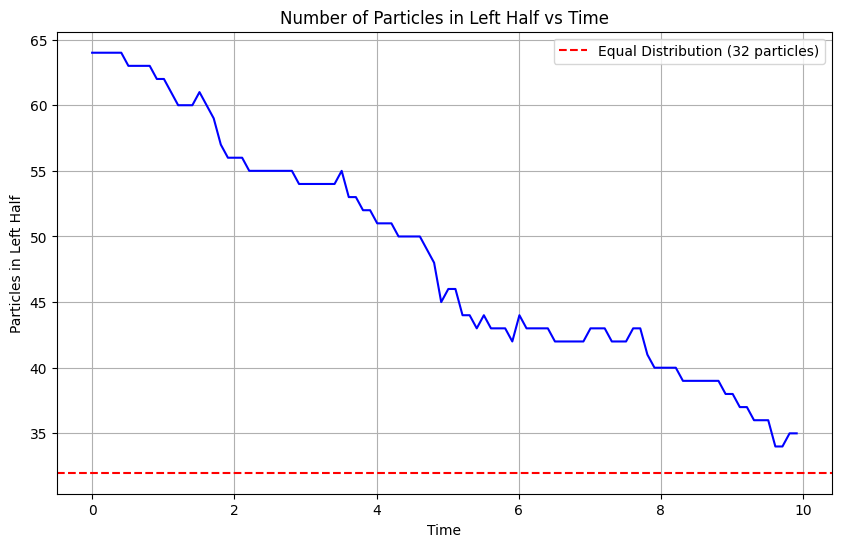

In [7]:
# Plot the number of particles in the left half vs time
plt.figure(figsize=(10, 6))
plt.plot(time_points, left_half_counts, 'b-')
plt.axhline(y=32, color='r', linestyle='--', label='Equal Distribution (32 particles)')
plt.title('Number of Particles in Left Half vs Time')
plt.xlabel('Time')
plt.ylabel('Particles in Left Half')
plt.grid(True)
plt.legend()
plt.show()